**Data Analytics of Airbnb Data:**

**Objective:**

In this project, we will be performing Data Analytics on an Open Dataset dataset coming from Airbnb.

**Overview of Airbnb Data:**

People's main criteria when visiting new places are reasonable accommodation and food. Airbnb (Air-Bed-Breakfast) is an online marketplace created to meet this need of people by renting out their homes for a short term. They offer this facility at a relatively lower price than hotels. Further people worldwide prefer the homely and economical service offered by them. They offer services across various geographical locations

**Dataset Source**
You can get the dataset for this assessment using the following link: https://www.kaggle.com/datasets/arianazmoudeh/airbnbopendata (Accessed 28/06/2023)



In [1]:

import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns
import plotly.express as px
sns.set()
%config InlineBackend.figure_format = 'svg'

In [2]:
# reading data 
df = pd.read_csv('bunesaires.csv')
# show first 5th row of data
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,11508,Condo in Buenos Aires · ★4.81 · 1 bedroom · 1 ...,42762,Candela,NaN,Palermo,-34.581840,-58.424150,Entire home/apt,17339,3,36,2023-05-13,0.27,1,208,8,NaN
1,14222,Rental unit in Palermo/Buenos Aires · ★4.78 · ...,87710233,María,NaN,Palermo,-34.586170,-58.410360,Entire home/apt,7807,7,108,2023-04-20,0.81,6,261,11,NaN
2,15074,Rental unit in Buenos Aires · 1 bedroom · 1 be...,59338,Monica,NaN,Nuñez,-34.538920,-58.465990,Private room,7665,29,0,NaN,NaN,1,0,0,NaN
3,16695,Loft in Buenos Aires · ★4.28 · 1 bedroom · 1 b...,64880,Elbio Mariano,NaN,Monserrat,-34.614390,-58.376110,Entire home/apt,12738,2,46,2019-11-30,0.31,9,147,0,NaN
4,20062,Rental unit in Buenos Aires · ★4.93 · 2 bedroo...,75891,Sergio Damian,NaN,Palermo,-34.581848,-58.441605,Entire home/apt,25660,2,283,2023-06-11,1.77,4,118,31,NaN


In [3]:
def change_dtype(list1,typ):
    newlist = []
    for i in list1:
        try :
            newlist.append(typ(i))
        except:
             newlist.append(None)
    return newlist

In [4]:

# Split name columns based on "·" delimiter
split_columns = df['name'].str.split('·', expand=True)

# Rename the columns that splitted
split_columns.columns = ['property_Type', 'rating', 'bedrooms', 'beds', 'baths']
split_columns ['property_Type']= split_columns['property_Type'].str.split(' ',expand = True)[0]

split_columns['rating'] = split_columns['rating'].str.replace('★','')
split_columns['rating'] = split_columns['rating'].str.strip()
split_columns['rating'] = change_dtype(split_columns['rating'], float)

split_columns['beds'] = split_columns['beds'].str.strip()
split_columns['beds'] = split_columns['beds'].str.split(' ',expand = True)[0]
split_columns['beds'] = change_dtype(split_columns['beds'],int)

split_columns['bedrooms'] = split_columns['bedrooms'].str.strip()
split_columns['bedrooms'] = split_columns['bedrooms'].str.split(' ',expand = True)[0]
split_columns['bedrooms'] = change_dtype(split_columns['bedrooms'],int)

split_columns['baths'] = split_columns['baths'].str.strip()
split_columns['baths'] = split_columns['baths'].str.split(' ',expand = True)[0]
split_columns['baths'] = change_dtype(split_columns['baths'],float)

df = pd.concat([df, split_columns], axis=1)

df.drop('name',axis =1, inplace = True)

In [5]:
## Check for missing values in the dataframe and display the count in ascending order.
missing_values = df.isna()
missing_count = missing_values.sum().sort_values(ascending=True)

# view the proportion of missing values
proportion_missing = missing_values.sum() / len(df)
proportion_count = proportion_missing.sort_values(ascending=True)

missing_table = pd.concat([missing_count, proportion_count], axis=1)
missing_table.columns = ['Missing Count', 'Proportion']
missing_table

,Missing Count,Proportion
id,0,0.000000
property_Type,0,0.000000
number_of_reviews_ltm,0,0.000000
availability_365,0,0.000000
calculated_host_listings_count,0,0.000000
minimum_nights,0,0.000000
price,0,0.000000
number_of_reviews,0,0.000000
longitude,0,0.000000
latitude,0,0.000000


In [6]:
df.drop(['license','neighbourhood_group'],axis = 1, inplace = True)

In [7]:
df.drop(['id','host_id','host_name'],axis = 1, inplace = True)
# df

In [8]:
# fill null values
df['beds'].fillna(df['beds'].mode()[0],inplace = True)
df['baths'].fillna(df['baths'].mode()[0],inplace = True)

df['bedrooms'].fillna(df['bedrooms'].mode()[0],inplace = True)

df["last_review"] = df["last_review"].fillna(pd.NaT)
df['reviews_per_month'].fillna(df['reviews_per_month'].mean(),inplace = True)
df['rating'].fillna(df['rating'].mean(),inplace = True)




In [9]:
def transform_value(value):
    if 0 < value <= 1:
        return round(value)
    elif 1 < value <= 2:
        return round(value)
    elif 2 < value <=3 :
        return round(value)
    elif 3 < value <=4:
        return round(value)
    return round(value)
df['rating'] = df['rating'].apply(transform_value)

In [10]:
df['last_review'] = pd.to_datetime(df['last_review'], format = "%Y-%m-%d")
# df

In [11]:
df.describe(include = np.number).T

,count,mean,std,min,25%,50%,75%,max
latitude,26204.0,-34.590773,0.018311,-34.69370,-34.601158,-34.590055,-34.58043,-3.453498e+01
longitude,26204.0,-58.418323,0.030168,-58.53089,-58.438060,-58.420240,-58.39392,-5.835541e+01
price,26204.0,17529.328690,175401.771074,175.00000,7406.500000,10190.000000,15286.00000,2.529509e+07
minimum_nights,26204.0,6.300145,24.286468,1.00000,2.000000,3.000000,4.00000,1.000000e+03
number_of_reviews,26204.0,21.823386,38.715892,0.00000,1.000000,7.000000,25.00000,6.570000e+02
reviews_per_month,26204.0,1.395734,1.246685,0.01000,0.500000,1.350000,1.71000,2.047000e+01
calculated_host_listings_count,26204.0,16.062815,33.051039,1.00000,1.000000,2.000000,11.00000,1.880000e+02
availability_365,26204.0,213.903335,127.418208,0.00000,89.000000,227.000000,342.00000,3.650000e+02
number_of_reviews_ltm,26204.0,9.561327,13.972815,0.00000,0.000000,4.000000,14.00000,3.770000e+02
rating,26204.0,4.919821,0.282188,0.00000,5.000000,5.000000,5.00000,5.000000e+00


<Axes: xlabel='price'>

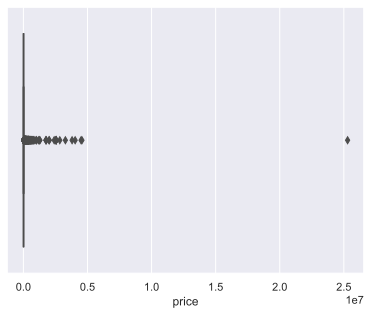

In [12]:
sns.boxplot(data=df,x='price')

In [13]:
#Subset data: Remove outliers for "price"

low, high = df['price'].quantile([0.1,0.9])
df = df[df['price'].between(low, high)]

<Axes: xlabel='price'>

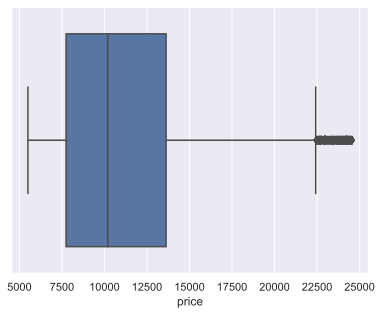

In [14]:
sns.boxplot(data=df,x='price')

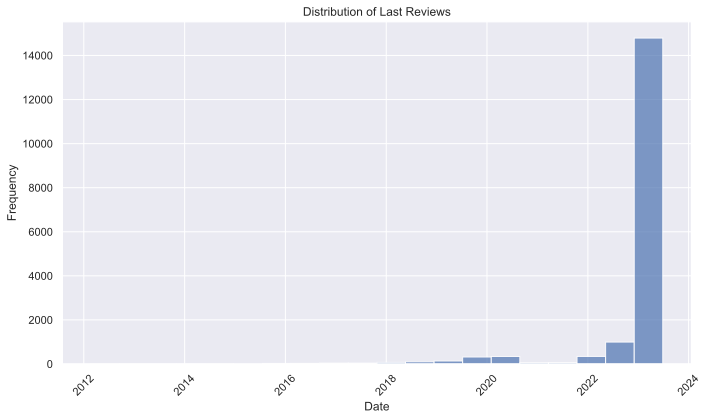

In [15]:

df = df.set_index('last_review').sort_index()
plt.figure(figsize=(10, 6))
plt.hist(df.index, bins=20, color='b', alpha=0.7)
plt.title('Distribution of Last Reviews')
plt.xlabel('Date')
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

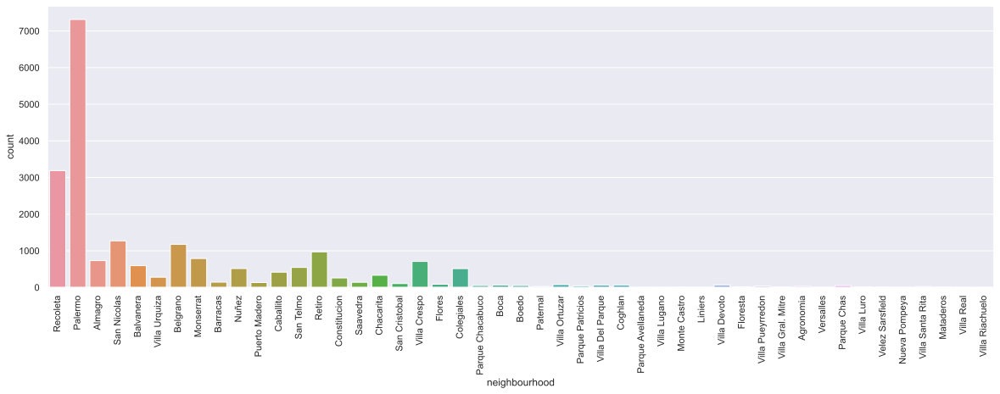

In [16]:
plt.figure(figsize=(20, 6))
ax = sns.countplot(data=df, x="neighbourhood")
plt.xticks(rotation=90)
# Show the plot
plt.show()

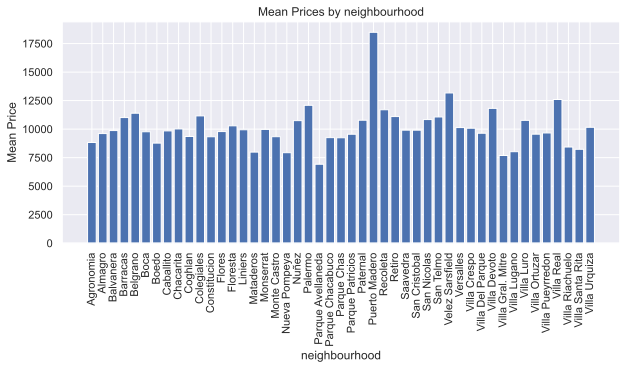

In [17]:
plt.figure(figsize=(10, 4))
mean_prices = df.groupby('neighbourhood')['price'].mean()

# Create a bar plot to visualize mean prices for each city
plt.bar(mean_prices.index, mean_prices.values)
plt.xlabel('neighbourhood')
plt.ylabel('Mean Price')
plt.title('Mean Prices by neighbourhood')
plt.xticks(rotation=90)
plt.show()





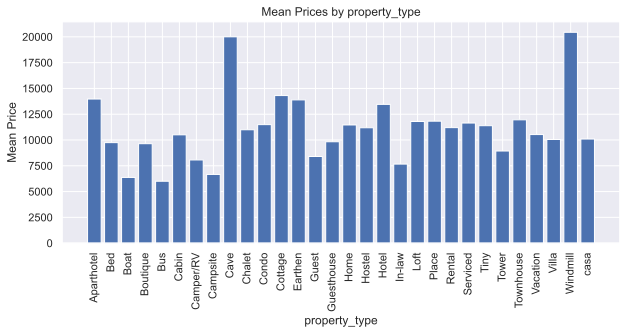

In [18]:
plt.figure(figsize=(10, 4))
mean_prices = df.groupby('property_Type')['price'].mean()

# Create a bar plot to visualize mean prices for each city
plt.bar(mean_prices.index, mean_prices.values)
plt.xlabel('property_type')
plt.ylabel('Mean Price')
plt.title('Mean Prices by property_type')
plt.xticks(rotation=90)
plt.show()


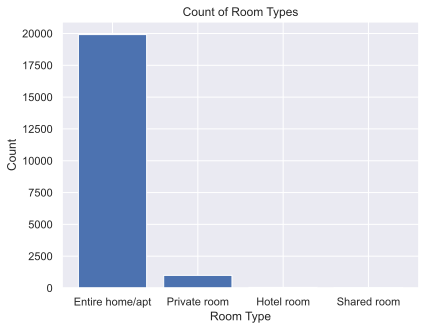

In [19]:
unique_values = df.room_type.unique()
counts = df.room_type.value_counts()
plt.bar(unique_values, counts)
plt.xlabel('Room Type')
plt.ylabel('Count')
plt.title('Count of Room Types')
plt.show()

<Axes: xlabel='price', ylabel='room_type'>

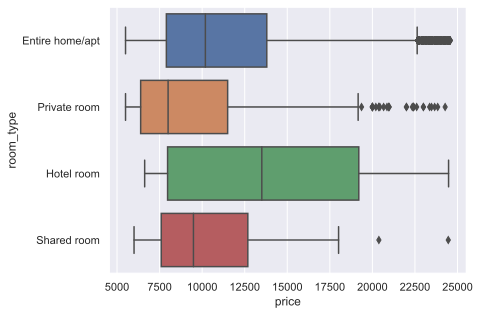

In [20]:
sns.boxplot(data=df,x='price', y='room_type')

In [21]:
# df['room_type'] = (df['room_type']== 'Hotel room')
# dic = {True:'Hotel room',False :'other'}
# df ['room_type'] = df['room_type'].map(dic)

<Axes: xlabel='room_type', ylabel='availability_365'>

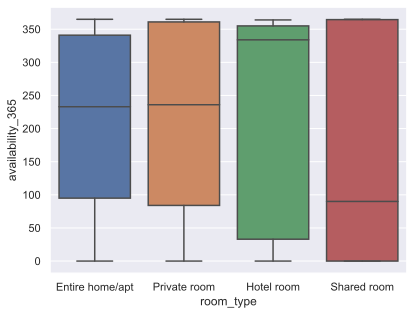

In [22]:
sns.boxplot(df,y='availability_365',x='room_type')


<Axes: >

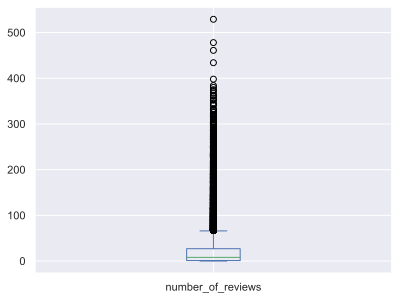

In [23]:
df['number_of_reviews'].plot(kind = 'box')


In [24]:
# rmoving outlier from number of reviews
low, high = df['number_of_reviews'].quantile([0.1,0.9])
df = df[df['number_of_reviews'].between(low, high)]

<Axes: >

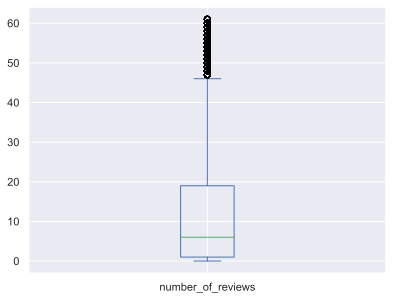

In [25]:
df['number_of_reviews'].plot(kind = 'box')


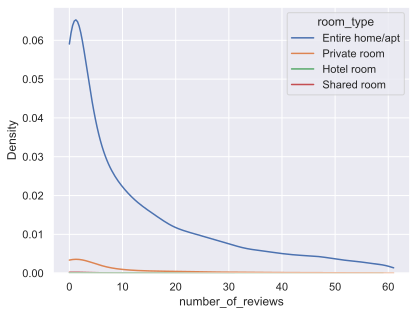

In [26]:
sns.kdeplot(df, x='number_of_reviews',hue='room_type',cut=0);


<Axes: xlabel='number_of_reviews', ylabel='room_type'>

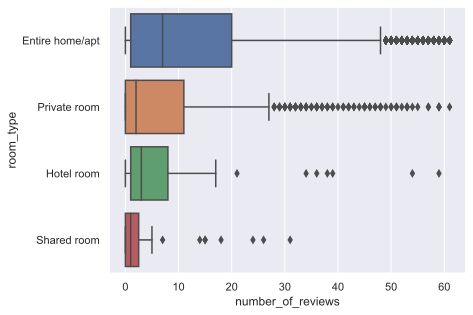

In [27]:
sns.boxplot(df,x='number_of_reviews', y='room_type')


<Axes: xlabel='rating', ylabel='number_of_reviews'>

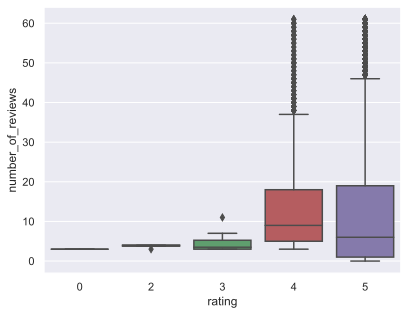

In [28]:
sns.boxplot(df,x='rating', y='number_of_reviews')


<Axes: xlabel='rating', ylabel='availability_365'>

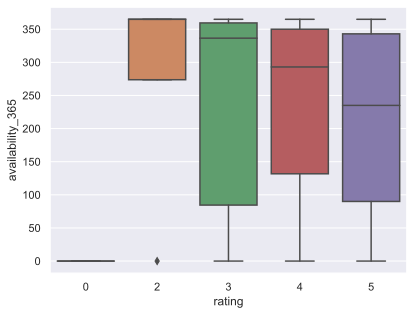

In [29]:
sns.boxplot(df,x='rating', y='availability_365')


In [30]:
df['reviews_per_month'].describe()


count    18892.000000
mean         1.373655
std          1.207977
min          0.010000
25%          0.490000
50%          1.290000
75%          1.670000
max         14.670000
Name: reviews_per_month, dtype: float64

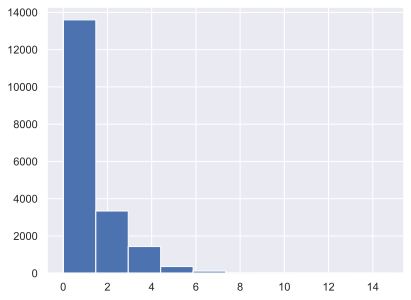

In [31]:
df['reviews_per_month'].hist();


<Axes: xlabel='reviews_per_month', ylabel='Density'>

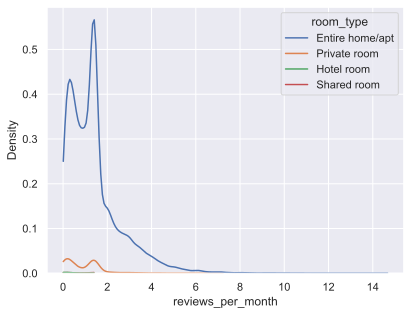

In [32]:
sns.kdeplot(df,x='reviews_per_month', hue='room_type',cut=0)


<Axes: >

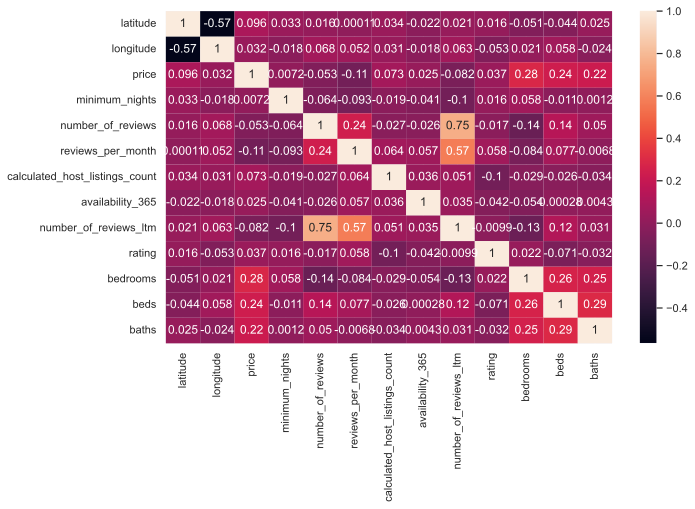

In [33]:
plt.figure(figsize=(10, 6))

corr= df.corr(numeric_only=True)
sns.heatmap(corr, annot= True)

In [34]:
fig = px.scatter_mapbox(
    df,  # Our DataFrame
    lat='latitude',
    lon = 'longitude',
    width=600,  # Width of map
    height=600,  # Height of map
    color='price',
    hover_data={"price":True,'property_Type':True,'rating':True,'bedrooms':True,'room_type':True,'availability_365':True}  # Display price when hovering mouse over house
)

fig.update_layout(mapbox_style="open-street-map")

fig.show()